QUESTION 6.6.1

In [ ]:
#Part A -- add the loop to make run for 50 iterations

import numpy as np
import random
import matplotlib.pyplot as plt
from mpl_toolkits. mplot3d import Axes3D

#######################   P a r a b o l i c  c l u s t e r s      ###########################
#####################   S y n t h e t i c  Data C r e a t i o n     #########################

nData=2000
nTrain =1000
nEpoch=4 # number of training points
nTest = 2000
alpha =0.01 #(learning rate)

std=0.5
x=np.zeros((2*nData,2))
t=np.zeros((2*nData))
r=np.random.normal(0,std,2*nData)
the=2*np.pi*np.random.rand(2*nData)

# w11f=np.zeros(nEpoch*nTrain)
# w12f=np.zeros(nEpoch*nTrain)

#cluster 1
h=-6+12*np.random.rand(nData)
v=5+(h**2)/6
x[0:nData,0]=h + r[0:nData]*np.cos(the[0:nData])
x[0:nData,1]=v + r[0:nData]*np.sin(the[0:nData])
t[0:nData]=0

#Cluster 2
h=-5+10*np.random.rand(nData)
v=10+(h**2)/4
x[nData:2*nData,0]=h + r[nData:2*nData]*np.cos(the[nData:2*nData])
x[nData:2*nData,1]=v + r[nData:2*nData]*np.sin(the[nData:2*nData])
t[nData:2*nData]=1

#######################  Normalization   ################################
x[:,0]=1 + 0.1*x[:,0]
x[:,1]=1 + 0.1*x[:,1]

for k in range(50):
  ################# Parameter Intialization    ############################
  #########################################################################
  w11=0.5-np.random.rand(); w12=0.5-np.random.rand()
  w21=0.5-np.random.rand(); w22=0.5-np.random.rand()
  b2=0.5-np.random.rand(); b1=0.5-np.random.rand()
  ww1=0.5-np.random.rand(); ww2=0.5-np.random.rand()
  bb=0.5-np.random.rand()

  a=range(0,2*nData)
  sp=random.sample(a,nTrain+nTest) # indexes for random selection of data fo
                                  #  training and testing
  #Training
  for epoch in range(0,nEpoch):
    for i in range(0,nTrain):
      y1=b1+w11*x[sp[i],0]+w12*x[sp[i],1]
      y2=b2+w21*x[sp[i],0]+w22*x[sp[i],1]
      dxx1=y1>0; dxx2=y2>0 # this is the rectalinear function
      xx1=dxx1*y1;xx2=dxx2*y2
      yy= xx1*ww1 + xx2*ww2 + bb
      # yy has to also go through a activating function
      yy=yy>0
      e=t[sp[i]]-yy

      #updates -- back prop algo -- use derivatives and update rule
      ww1=ww1 + alpha*e*xx1; ww2=ww2 + alpha*e*xx2;
      bb=bb + alpha*e
      w11=w11 + alpha*e*ww1*dxx1*x[sp[i],0]
      w12=w12 + alpha*e*ww1*dxx1*x[sp[i],1]
      w21=w21 + alpha*e*ww2*dxx2*x[sp[i],0]
      w22=w22 + alpha*e*ww2*dxx2*x[sp[i],1]
      b1=b1 + alpha*e*ww1*dxx1;  b2=b2 + alpha*e*ww2*dxx2

  #testing
  er=0
  for i in range(nTrain,nTrain+nTest):
      y1 = b1 + w11*x[sp[i],0] + w12*x[sp[i],1]
      y2 = b2 + w21*x[sp[i],0] + w22*x[sp[i],1]
      dxx1=y1>0; xx1=y1*dxx1;  dxx2=y2>0; xx2=y2*dxx2     #  rect. activation
      yy = bb + ww1*xx1 + ww2*xx2
      yy=yy>0
      e = abs(t[sp[i]] - yy)
      er=er+e
  er=er/nTest
  if er<0.05:
      nSuccess=nSuccess+1
print("The nSuccess of times the error rate was less than 0.05 for the training and testing running 50 times is :",nSuccess)


The nSuccess of times the error rate was less than 0.05 for the training and testing running 50 times is : 6


In [ ]:
#Part B/C

#------------------------- making a function so we can expiriment with alpha and learning rate -------------------------------------

import numpy as np
import random
import matplotlib.pyplot as plt
from mpl_toolkits. mplot3d import Axes3D


def NN221(learningrate,epoch,iterations):
  nData=2000
  nTrain =1000
  nEpoch=epoch # number of training points
  nTest = 2000
  alpha =learningrate #(learning rate)
  std=0.5
  x=np.zeros((2*nData,2))
  t=np.zeros((2*nData))
  r=np.random.normal(0,std,2*nData)
  the=2*np.pi*np.random.rand(2*nData)
  #cluster 1
  h=-6+12*np.random.rand(nData)
  v=5+(h**2)/6
  x[0:nData,0]=h + r[0:nData]*np.cos(the[0:nData])
  x[0:nData,1]=v + r[0:nData]*np.sin(the[0:nData])
  t[0:nData]=0
  #Cluster 2
  h=-5+10*np.random.rand(nData)
  v=10+(h**2)/4
  x[nData:2*nData,0]=h + r[nData:2*nData]*np.cos(the[nData:2*nData])
  x[nData:2*nData,1]=v + r[nData:2*nData]*np.sin(the[nData:2*nData])
  t[nData:2*nData]=1
  x[:,0]=1 + 0.1*x[:,0]
  x[:,1]=1 + 0.1*x[:,1]
  nSuccess=0
  for i in range(iterations):
    w11=0.5-np.random.rand(); w12=0.5-np.random.rand()
    w21=0.5-np.random.rand(); w22=0.5-np.random.rand()
    b2=0.5-np.random.rand(); b1=0.5-np.random.rand()
    ww1=0.5-np.random.rand(); ww2=0.5-np.random.rand()
    bb=0.5-np.random.rand()
    a=range(0,2*nData)
    sp=random.sample(a,nTrain+nTest) # indexes for random selection of data for #  training and testing
    #Training
    for epoch in range(0,nEpoch):
      for i in range(0,nTrain):
        y1=b1+w11*x[sp[i],0]+w12*x[sp[i],1]
        y2=b2+w21*x[sp[i],0]+w22*x[sp[i],1]
        dxx1=y1>0; dxx2=y2>0 # this is the rectalinear function
        xx1=dxx1*y1;xx2=dxx2*y2
        yy= xx1*ww1 + xx2*ww2 + bb
        # yy has to also go through a activating function
        yy=yy>0
        e=t[sp[i]]-yy
        #updates -- back prop algo -- use derivatives and update rule
        ww1=ww1 + alpha*e*xx1; ww2=ww2 + alpha*e*xx2;
        bb=bb + alpha*e
        w11=w11 + alpha*e*ww1*dxx1*x[sp[i],0]
        w12=w12 + alpha*e*ww1*dxx1*x[sp[i],1]
        w21=w21 + alpha*e*ww2*dxx2*x[sp[i],0]
        w22=w22 + alpha*e*ww2*dxx2*x[sp[i],1]
        b1=b1 + alpha*e*ww1*dxx1;  b2=b2 + alpha*e*ww2*dxx2
    er=0
    for i in range(nTrain,nTrain+nTest):
        y1 = b1 + w11*x[sp[i],0] + w12*x[sp[i],1]
        y2 = b2 + w21*x[sp[i],0] + w22*x[sp[i],1]
        dxx1=y1>0; xx1=y1*dxx1;  dxx2=y2>0; xx2=y2*dxx2     #  rect. activation
        yy = bb + ww1*xx1 + ww2*xx2
        yy=yy>0
        e = abs(t[sp[i]] - yy)
        er=er+e
    er=er/nTest
    if er<0.05:
      nSuccess=nSuccess+1

  return(nSuccess)

# --------------------------------------------------------- expirimenting with alpha and learning rate, creating a table -------------------------------------------------
import pandas as pd
from tabulate import tabulate
data={}
temp=[]

def add_values_in_dict(sample_dict, key, list_of_values):
    ''' Append multiple values to a key in
        the given dictionary '''
    if key not in sample_dict:
        sample_dict[key] = list()
    sample_dict[key].extend(list_of_values)
    return sample_dict


# from 0.001 to 0.01 increment by 0.001
for alpha in np.arange(0.001,0.01,0.001):
  temp.clear()
  for epoch in range(1,7):
    print("Learning Rate:",alpha)
    print("Number of Epoch:",epoch)
    result=NN221(alpha,epoch,50)
    temp.append(result)
    print("The Average Mean Squared Error is :",result)
    print("--------------------------------")
    if epoch ==6:
      add_values_in_dict(data,alpha,temp)


for alpha in np.arange(0.01,0.06,0.01):
  temp.clear()
  for epoch in range(1,7):
    print("Learning Rate:",alpha)
    print("Number of Epoch:",epoch)
    result=NN221(alpha,epoch,50)
    temp.append(result)
    print("The Average Mean Squared Error is is :",result)
    print("--------------------------------")
    if epoch ==6:
      add_values_in_dict(data,alpha,temp)

#define header names
col_names = ["Epoch =1", "Epoch =2", "Epoch =3", "Epoch =4", "Epoch =5", "Epoch =6"]

#display table
df = pd.DataFrame.from_dict(data, orient='index', columns=col_names)
print(tabulate(df, headers = col_names, tablefmt = 'psql'))

**Part C** -- when I ran the code, I got the table below

** The collumn on the far left is the learning rates we experimented  with
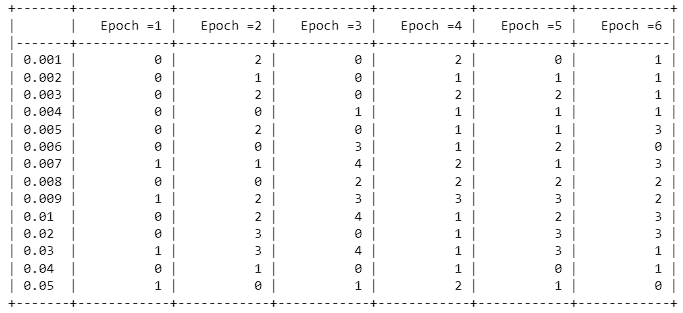

In [ ]:
#Part D
import numpy as np
import random
import matplotlib.pyplot as plt
import mpl_toolkits
from mpl_toolkits. mplot3d import Axes3D

def NN221(learningrate,epoch,iterations):
  nData=2000
  nTrain =1000
  nEpoch=epoch # number of training points
  nTest = 2000
  alpha =learningrate #(learning rate)
  std=0.5
  x=np.zeros((2*nData,2))
  t=np.zeros((2*nData))
  r=np.random.normal(0,std,2*nData)
  the=2*np.pi*np.random.rand(2*nData)
  w11f=np.zeros(nEpoch*nTrain)
  w12f=np.zeros(nEpoch*nTrain)

  #cluster 1
  h=-6+12*np.random.rand(nData)
  v=5+(h**2)/6
  x[0:nData,0]=h + r[0:nData]*np.cos(the[0:nData])
  x[0:nData,1]=v + r[0:nData]*np.sin(the[0:nData])
  t[0:nData]=0
  #Cluster 2
  h=-5+10*np.random.rand(nData)
  v=10+(h**2)/4
  x[nData:2*nData,0]=h + r[nData:2*nData]*np.cos(the[nData:2*nData])
  x[nData:2*nData,1]=v + r[nData:2*nData]*np.sin(the[nData:2*nData])
  t[nData:2*nData]=1
  x[:,0]=1 + 0.1*x[:,0]
  x[:,1]=1 + 0.1*x[:,1]
  nSuccess=0
  for i in range(iterations):
    w11=0.5-np.random.rand(); w12=0.5-np.random.rand()
    w21=0.5-np.random.rand(); w22=0.5-np.random.rand()
    b2=0.5-np.random.rand(); b1=0.5-np.random.rand()
    ww1=0.5-np.random.rand(); ww2=0.5-np.random.rand()
    bb=0.5-np.random.rand()
    a=range(0,2*nData)
    sp=random.sample(a,nTrain+nTest) # indexes for random selection of data for #  training and testing
    #Training
    p=0
    for epoch in range(0,nEpoch):
      for i in range(0,nTrain):
        y1=b1+w11*x[sp[i],0]+w12*x[sp[i],1]
        y2=b2+w21*x[sp[i],0]+w22*x[sp[i],1]
        dxx1=y1>0; dxx2=y2>0 # this is the rectalinear function
        xx1=dxx1*y1;xx2=dxx2*y2
        yy= xx1*ww1 + xx2*ww2 + bb
        # yy has to also go through a activating function
        yy=yy>0
        e=t[sp[i]]-yy
        #updates -- back prop algo -- use derivatives and update rule
        ww1=ww1 + alpha*e*xx1; ww2=ww2 + alpha*e*xx2;
        bb=bb + alpha*e
        w11=w11 + alpha*e*ww1*dxx1*x[sp[i],0]
        w12=w12 + alpha*e*ww1*dxx1*x[sp[i],1]
        w21=w21 + alpha*e*ww2*dxx2*x[sp[i],0]
        w22=w22 + alpha*e*ww2*dxx2*x[sp[i],1]
        b1=b1 + alpha*e*ww1*dxx1;  b2=b2 + alpha*e*ww2*dxx2
        w11f[p]=w11; w12f[p]=w12;
        p=p+1
    er=0
    for i in range(nTrain,nTrain+nTest):
        y1 = b1 + w11*x[sp[i],0] + w12*x[sp[i],1]
        y2 = b2 + w21*x[sp[i],0] + w22*x[sp[i],1]
        dxx1=y1>0; xx1=y1*dxx1;  dxx2=y2>0; xx2=y2*dxx2     #  rect. activation
        yy = bb + ww1*xx1 + ww2*xx2
        yy=yy>0
        e = abs(t[sp[i]] - yy)
        er=er+e
    er=er/nTest
    if er<0.05:
      nSuccess=nSuccess+1
      plt.figure(figsize=(10,10))
      plt.scatter(x[0:nData,0], x[0:nData,1])
      plt.scatter(x[nData:2*nData,0], x[nData:2*nData,1])


      X = np.arange(0.25, 1.75, 0.02)
      Y = np.arange(1.25, 2.75, 0.02)
      X, Y = np.meshgrid(X, Y)
      y1 = b1 + w11*X + w12*Y
      y2 = b2 + w21*X + w22*Y
      dxx1=y1>0; xx1=y1*dxx1;  dxx2=y2>0; xx2=y2*dxx2     #  rect. activation
      yy = bb + ww1*xx1 + ww2*xx2
      Z=yy>0
      plt.scatter(X, Y, c=Z+1, alpha=0.3)

      plt.figure(figsize=(10,10))
      f=np.arange(0,nEpoch*nTrain,1)
      plt.plot(f,w11f)
      plt.figure(figsize=(10,10))
      plt.plot(f,w12f)
      plt.figure(figsize=(10,10))
      ax = plt.axes(projection='3d')
      ax.scatter(x[0:nData,0], x[0:nData,1], 0,  cmap='viridis', s=30)
      ax.scatter(x[nData:2*nData,0], x[nData:2*nData,1], 1,  cmap='viridis', s=30)

      #  ploting the separating planes
      X = np.arange(0.25, 1.75, 0.02)       # Shorter X-range for visibility
      Y = np.arange(1.25, 2.75, 0.02)

      X, Y = np.meshgrid(X, Y)
      y1 = b1 + w11*X + w12*Y
      y2 = b2 + w21*X + w22*Y
      dxx1=y1>0; xx1=y1*dxx1;  dxx2=y2>0; xx2=y2*dxx2     #  rect. activation
      yy = bb + ww1*xx1 + ww2*xx2
      Z=yy>0
      ax.plot_surface(X, Y, Z, rstride=1, cstride=1, cmap='viridis', alpha=0.5)


  return(nSuccess)

#I chose to use a learning rate of 0.07 and an epoch of 4
NN221(0.07,4,50)

The below pictuees, are what I got from one of my runs





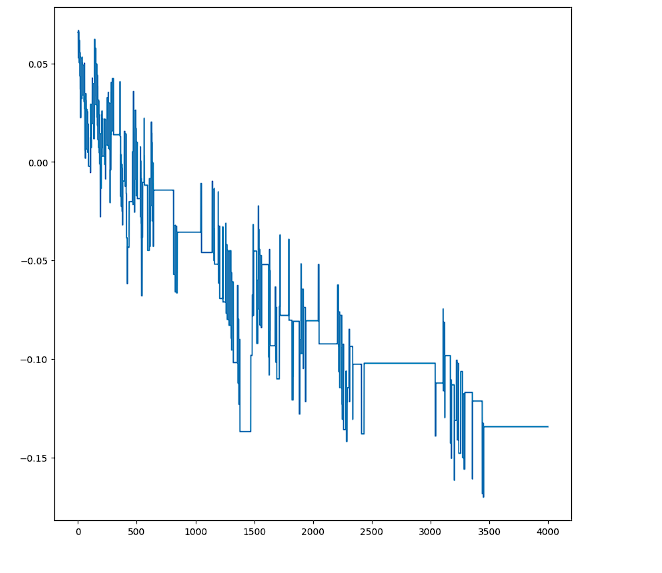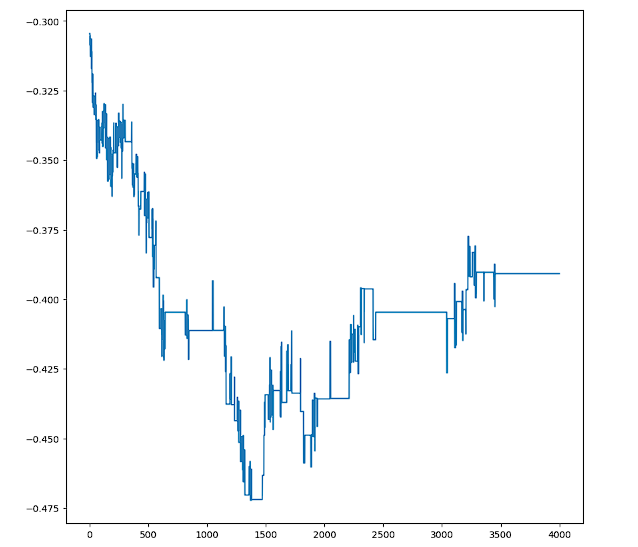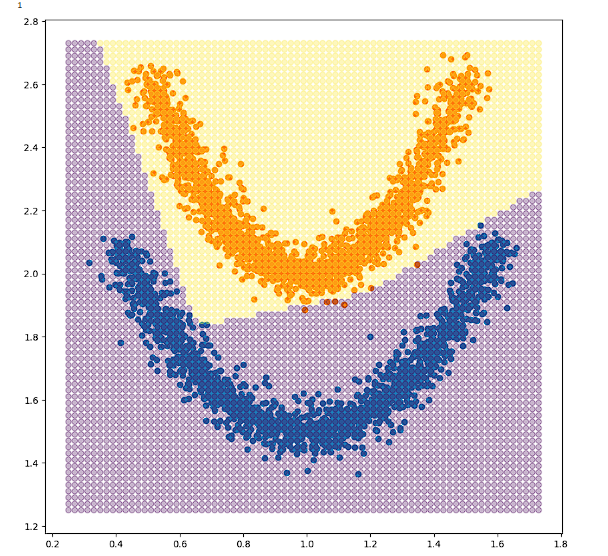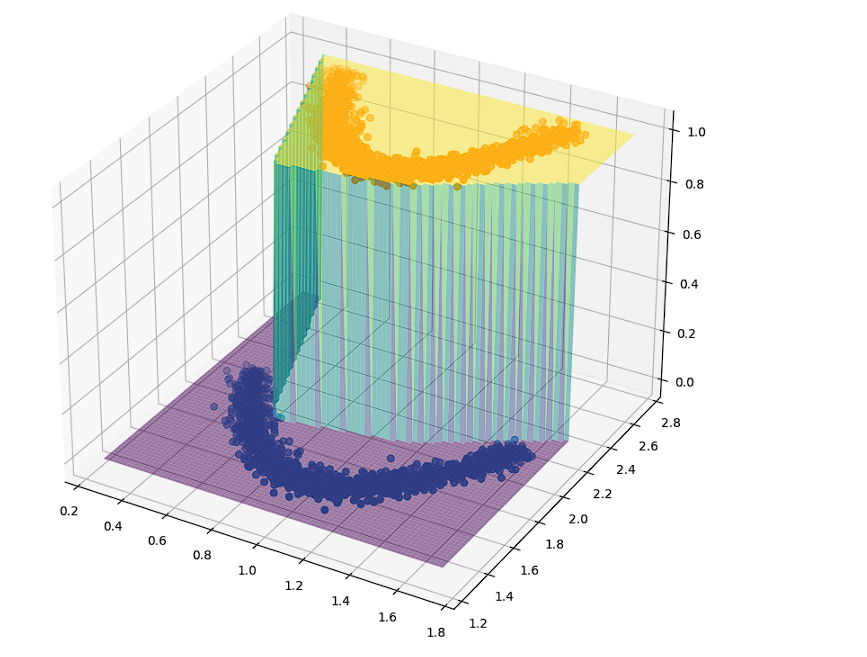

**Question 6.6.2**

In [ ]:
# PART A -- run the training and test for 50 iterations

import numpy as np
import random
import matplotlib.pyplot as plt
from mpl_toolkits. mplot3d import Axes3D

def NN241(learningrate,epoch,iterations):
  nData=2000
  nTrain =1000
  nEpoch=epoch # number of training points
  nTest = 2000
  alpha =learningrate #(learning rate)
  std=0.5
  x=np.zeros((2*nData,2))
  t=np.zeros((2*nData))
  r=np.random.normal(0,std,2*nData)
  the=2*np.pi*np.random.rand(2*nData)
  # w11f=np.zeros(nEpoch*nTrain)
  # w12f=np.zeros(nEpoch*nTrain)
  #cluster 1
  h=-6+12*np.random.rand(nData)
  v=5+(h**2)/6
  x[0:nData,0]=h + r[0:nData]*np.cos(the[0:nData])
  x[0:nData,1]=v + r[0:nData]*np.sin(the[0:nData])
  t[0:nData]=0
  #Cluster 2
  h=-5+10*np.random.rand(nData)
  v=10+(h**2)/4
  x[nData:2*nData,0]=h + r[nData:2*nData]*np.cos(the[nData:2*nData])
  x[nData:2*nData,1]=v + r[nData:2*nData]*np.sin(the[nData:2*nData])
  t[nData:2*nData]=1
  x[:,0]=1 + 0.1*x[:,0]
  x[:,1]=1 + 0.1*x[:,1]
  nSuccess=0
  for i in range(iterations):
    w11=0.5-np.random.rand(); w12=0.5-np.random.rand()
    w21=0.5-np.random.rand(); w22=0.5-np.random.rand()
    w31=0.5-np.random.rand(); w32=0.5-np.random.rand()
    w41=0.5-np.random.rand(); w42=0.5-np.random.rand()
    b2=0.5-np.random.rand(); b1=0.5-np.random.rand()
    b4=0.5-np.random.rand(); b3=0.5-np.random.rand()
    ww1=0.5-np.random.rand(); ww2=0.5-np.random.rand()
    ww3=0.5-np.random.rand(); ww4=0.5-np.random.rand()
    bb=0.5-np.random.rand()
    a=range(0,2*nData)
    sp=random.sample(a,nTrain+nTest)
    for epoch in range(0,nEpoch):
      for i in range(0,nTrain):
        y1=b1+w11*x[sp[i],0]+w12*x[sp[i],1]
        y2=b2+w21*x[sp[i],0]+w22*x[sp[i],1]
        y3=b3+w31*x[sp[i],0]+w32*x[sp[i],1]
        y4=b4+w41*x[sp[i],0]+w42*x[sp[i],1]
        dxx1=y1>0; dxx2=y2>0; dxx3=y3>0; dxx4=y4>0 # this is the rectalinear function
        xx1=dxx1*y1;xx2=dxx2*y2; xx3=dxx3*y3;xx4=dxx4*y4
        yy= xx1*ww1 + xx2*ww2 + xx3*ww3 + xx4*ww4 + bb
        yy=yy>0
        e=t[sp[i]]-yy
        #updates -- back prop algo -- use derivatives and update rule
        ww1=ww1 + alpha*e*xx1; ww2=ww2 + alpha*e*xx2;
        ww3=ww3 + alpha*e*xx3; ww4=ww4 + alpha*e*xx4;
        bb=bb + alpha*e
        w11=w11 + alpha*e*ww1*dxx1*x[sp[i],0]
        w12=w12 + alpha*e*ww1*dxx1*x[sp[i],1]
        w21=w21 + alpha*e*ww2*dxx2*x[sp[i],0]
        w22=w22 + alpha*e*ww2*dxx2*x[sp[i],1]
        w31=w31 + alpha*e*ww3*dxx3*x[sp[i],0]
        w32=w32 + alpha*e*ww3*dxx3*x[sp[i],1]
        w41=w41 + alpha*e*ww4*dxx4*x[sp[i],0]
        w42=w42 + alpha*e*ww4*dxx4*x[sp[i],1]
        b1=b1 + alpha*e*ww1*dxx1;  b2=b2 + alpha*e*ww2*dxx2
        b3=b3 + alpha*e*ww3*dxx3;  b4=b4 + alpha*e*ww4*dxx4
    er=0
    for i in range(nTrain,nTrain+nTest):
        y1 = b1 + w11*x[sp[i],0] + w12*x[sp[i],1]
        y2 = b2 + w21*x[sp[i],0] + w22*x[sp[i],1]
        y3=b3+w31*x[sp[i],0]+w32*x[sp[i],1]
        y4=b4+w41*x[sp[i],0]+w42*x[sp[i],1]

        dxx1=y1>0; dxx2=y2>0; dxx3=y3>0; dxx4=y4>0
        xx1=dxx1*y1;xx2=dxx2*y2; xx3=dxx3*y3;xx4=dxx4*y4

        yy= xx1*ww1 + xx2*ww2 + xx3*ww3 + xx4*ww4 + bb
        yy=yy>0
        e = abs(t[sp[i]] - yy)
        er=er+e
    er=er/nTest
    #print(er)
    if er<0.05:
      nSuccess=nSuccess+1
  return(nSuccess)

#Part A
print("The nSuccess of times the error rate was less than 0.05 for the training and testing running 50 times is :",NN241(0.01,4,50))

The nSuccess of times the error rate was less than 0.05 for the training and testing running 50 times is : 11


In [ ]:
#Part B/C

import pandas as pd
from tabulate import tabulate
data={}
temp=[]

def add_values_in_dict(sample_dict, key, list_of_values):
    ''' Append multiple values to a key in
        the given dictionary '''
    if key not in sample_dict:
        sample_dict[key] = list()
    sample_dict[key].extend(list_of_values)
    return sample_dict


# from 0.001 to 0.01 increment by 0.001
for alpha in np.arange(0.001,0.01,0.001):
  temp.clear()
  for epoch in range(1,7):
    print("Learning Rate:",alpha)
    print("Number of Epoch:",epoch)
    result=NN241(alpha,epoch,50)
    temp.append(result)
    print("The nSuccess of times the error rate was less than 0.05 is :",result)
    print("--------------------------------")
    if epoch ==6:
      add_values_in_dict(data,alpha,temp)


for alpha in np.arange(0.01,0.06,0.01):
  temp.clear()
  for epoch in range(1,7):
    print("Learning Rate:",alpha)
    print("Number of Epoch:",epoch)
    result=NN241(alpha,epoch,50)
    temp.append(result)
    print("The nSuccess of times the error rate was less than 0.05 is :",result)
    print("--------------------------------")
    if epoch ==6:
      add_values_in_dict(data,alpha,temp)

#define header names
col_names = ["Epoch =1", "Epoch =2", "Epoch =3", "Epoch =4", "Epoch =5", "Epoch =6"]

#display table
df = pd.DataFrame.from_dict(data, orient='index', columns=col_names)
print(tabulate(df, headers = col_names, tablefmt = 'psql'))

Learning Rate: 0.001
Number of Epoch: 1
The nSuccess of times the error rate was less than 0.05 is : 2
--------------------------------
Learning Rate: 0.001
Number of Epoch: 2
The nSuccess of times the error rate was less than 0.05 is : 4
--------------------------------
Learning Rate: 0.001
Number of Epoch: 3
The nSuccess of times the error rate was less than 0.05 is : 5
--------------------------------
Learning Rate: 0.001
Number of Epoch: 4
The nSuccess of times the error rate was less than 0.05 is : 2
--------------------------------
Learning Rate: 0.001
Number of Epoch: 5
The nSuccess of times the error rate was less than 0.05 is : 4
--------------------------------
Learning Rate: 0.001
Number of Epoch: 6
The nSuccess of times the error rate was less than 0.05 is : 8
--------------------------------
Learning Rate: 0.002
Number of Epoch: 1
The nSuccess of times the error rate was less than 0.05 is : 7
--------------------------------
Learning Rate: 0.002
Number of Epoch: 2
The nSuc

The table outputed after a run of the program is shown below.

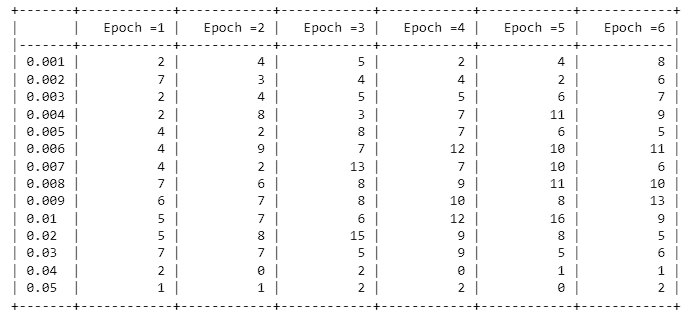

<ipython-input-34-3c022ffd0cdc>:119: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x[0:nData,0], x[0:nData,1], 0,  cmap='viridis', s=30)
<ipython-input-34-3c022ffd0cdc>:120: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x[nData:2*nData,0], x[nData:2*nData,1], 1,  cmap='viridis', s=30)
<ipython-input-34-3c022ffd0cdc>:97: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,10))


9

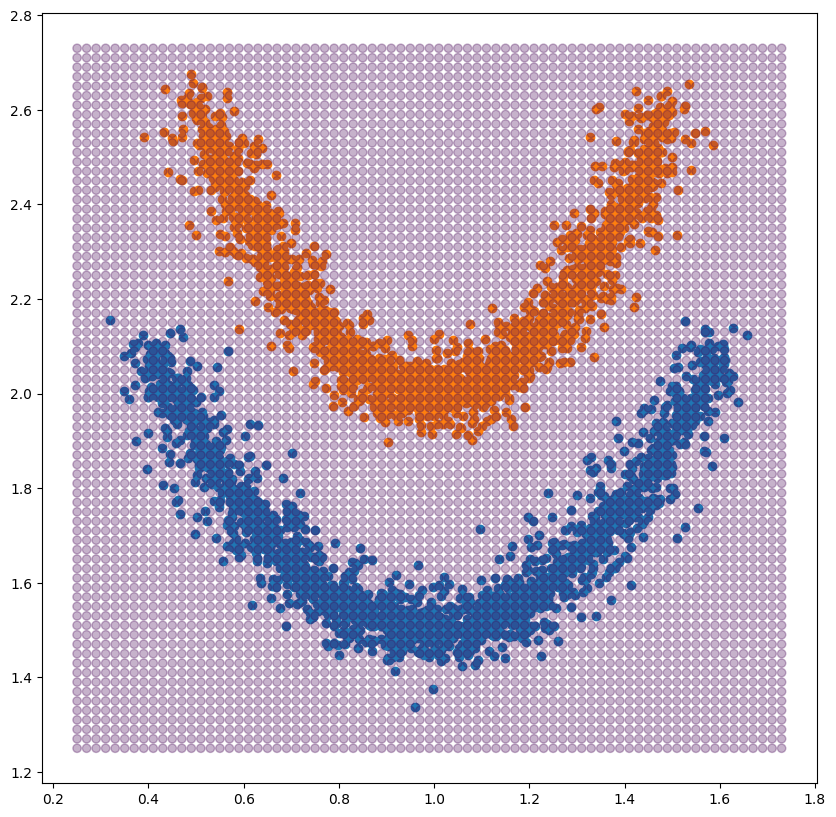

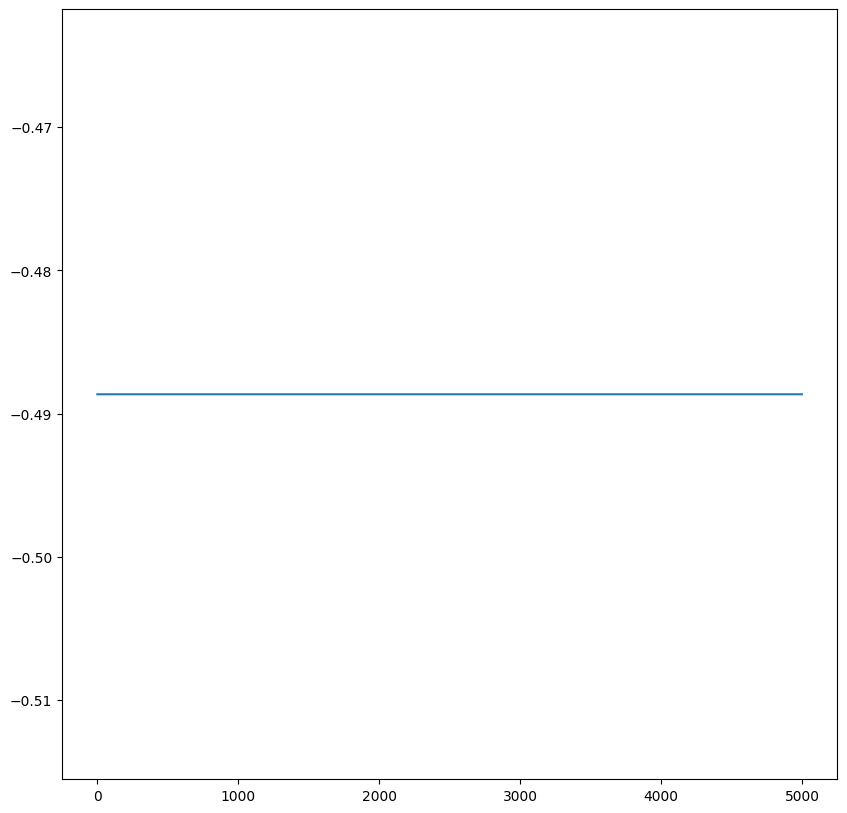

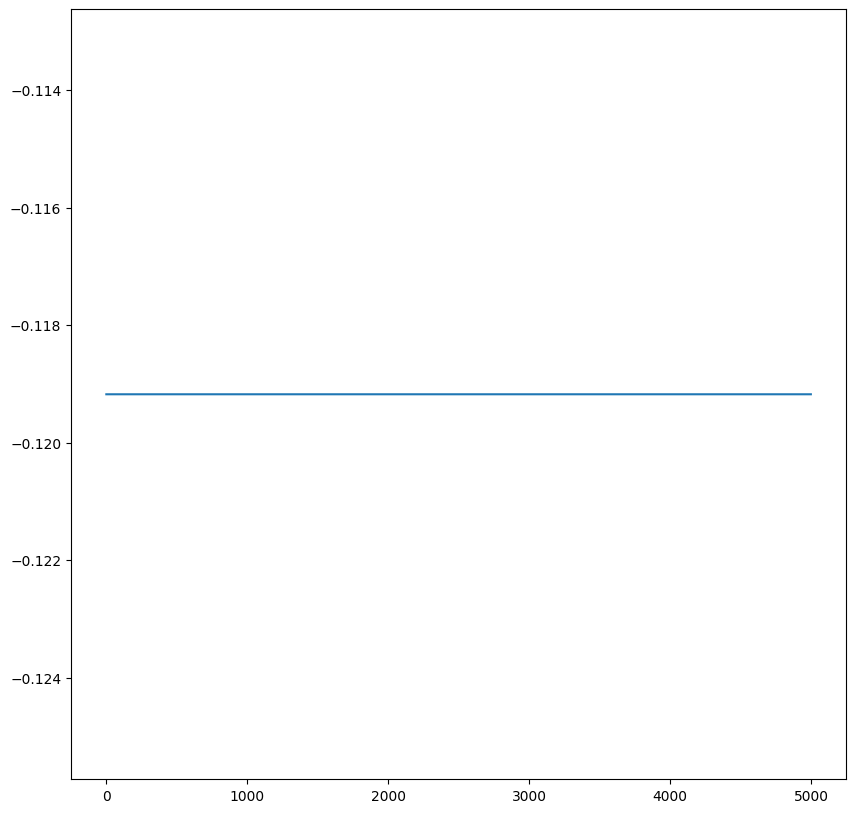

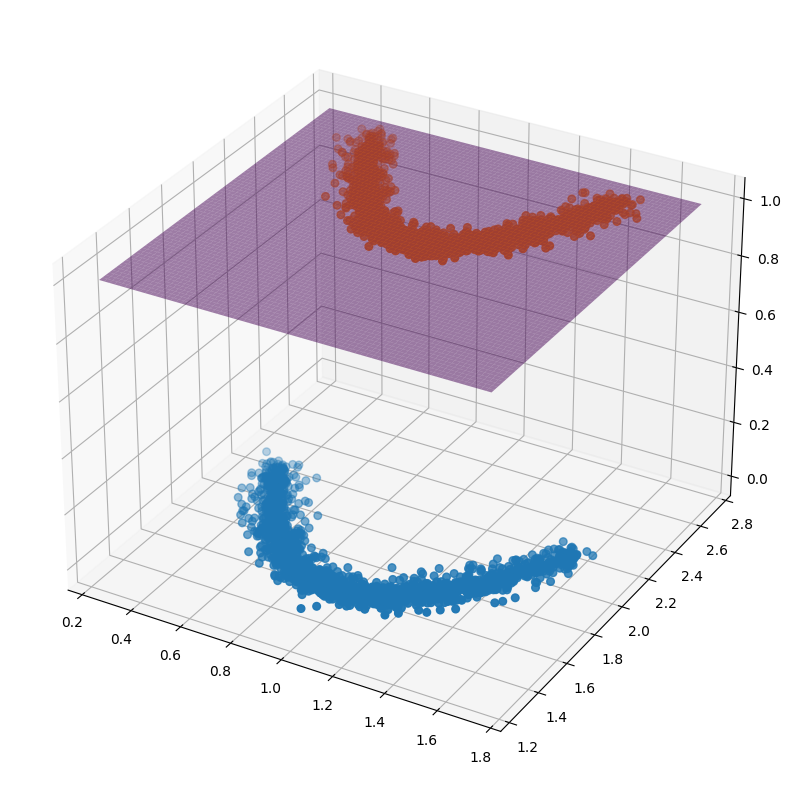

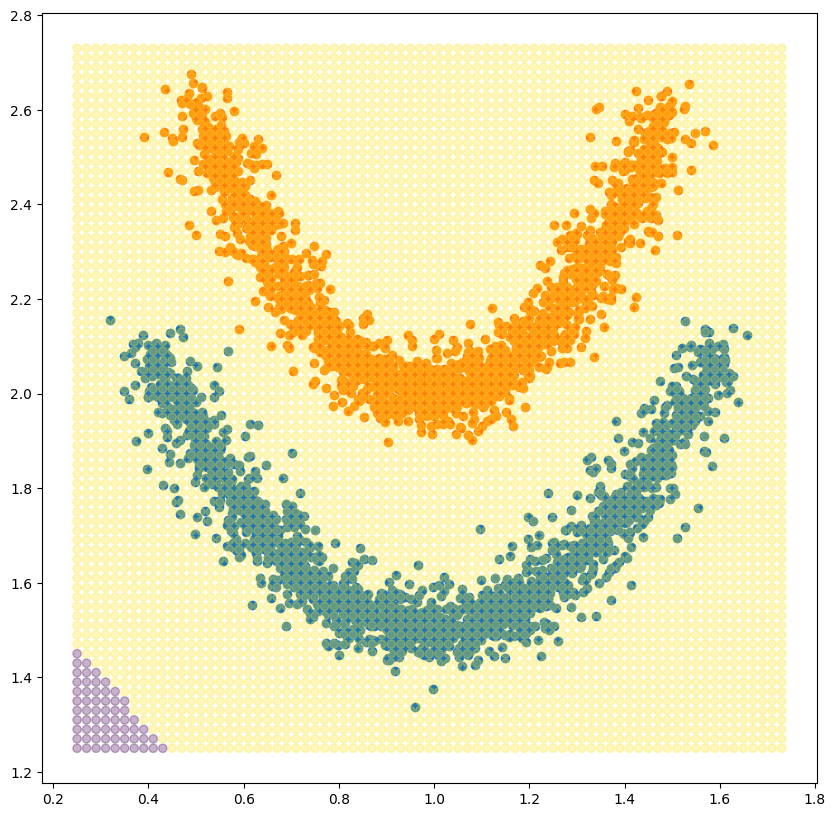

...

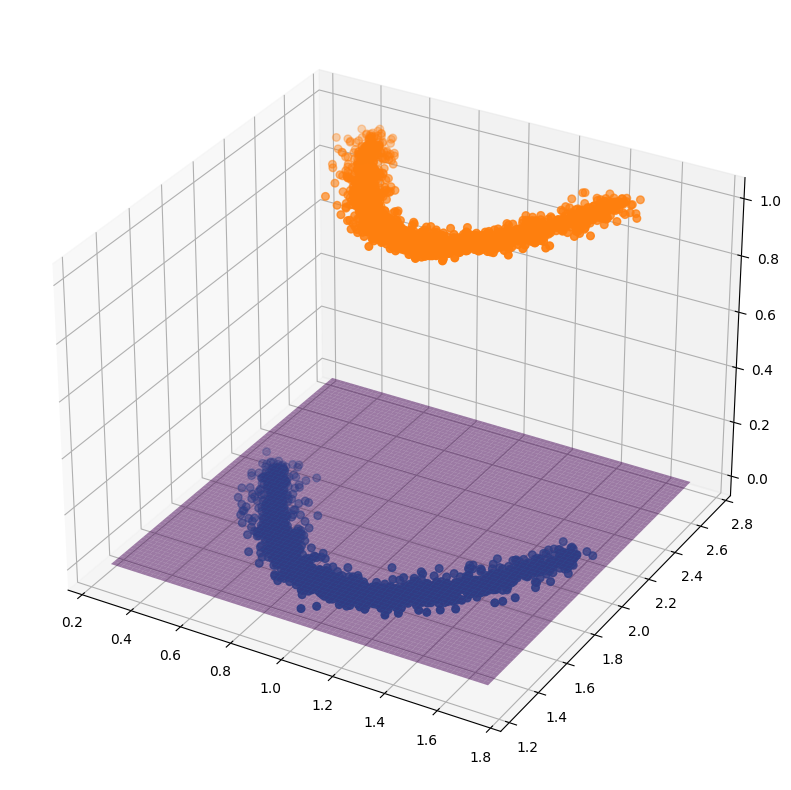

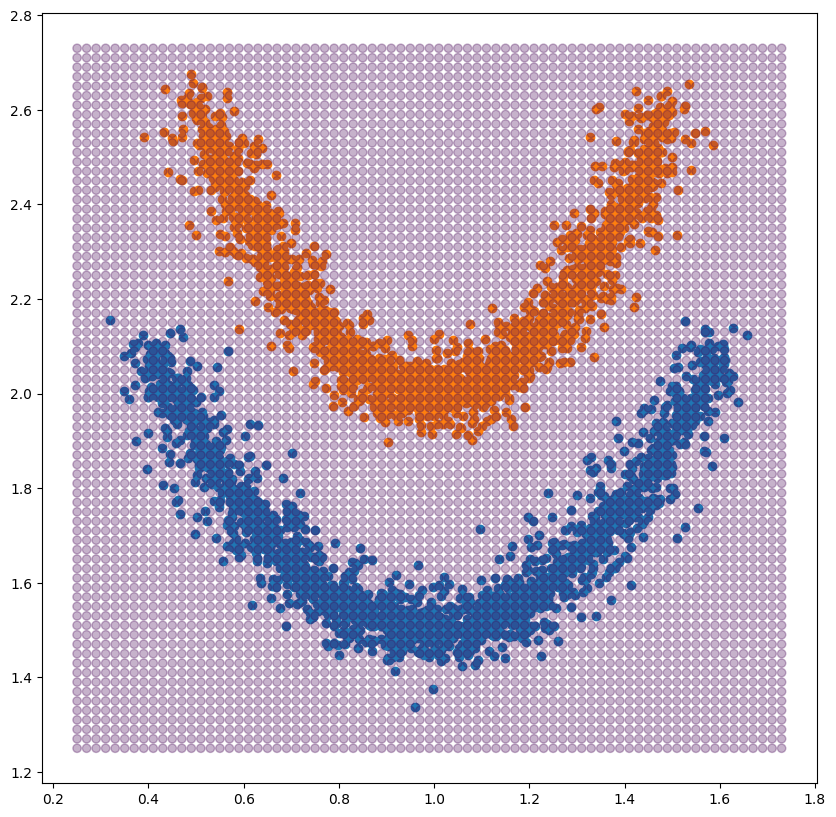

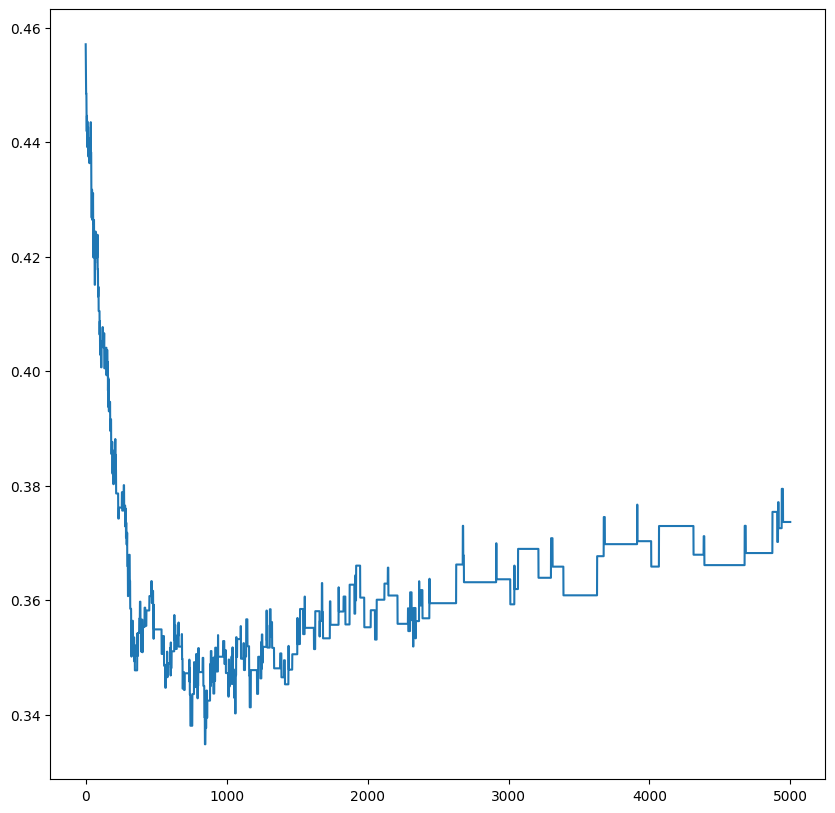

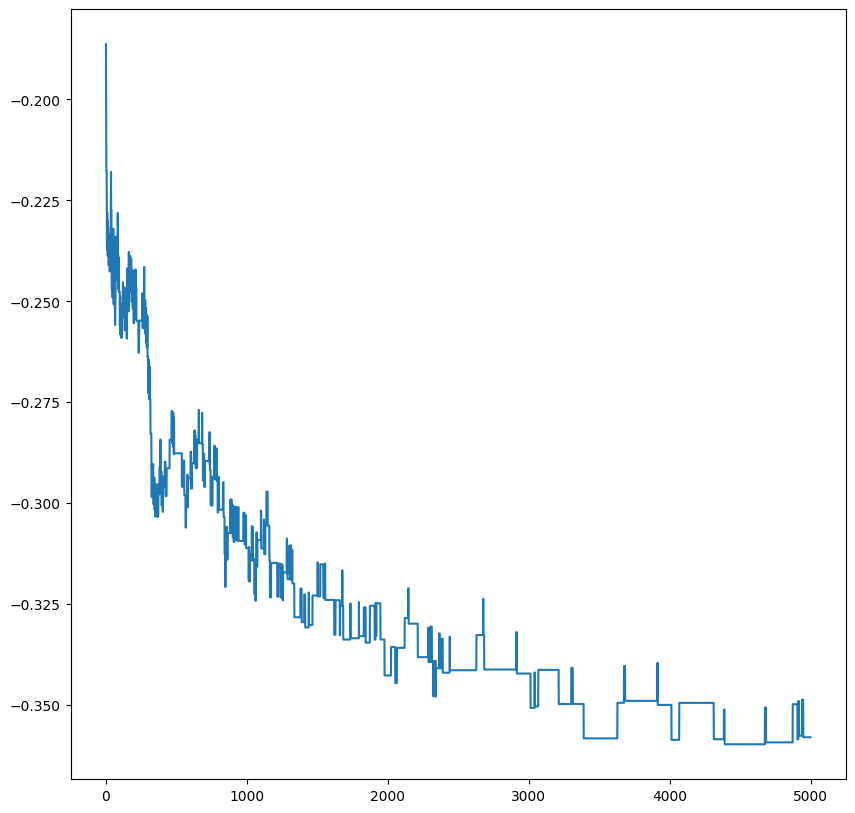

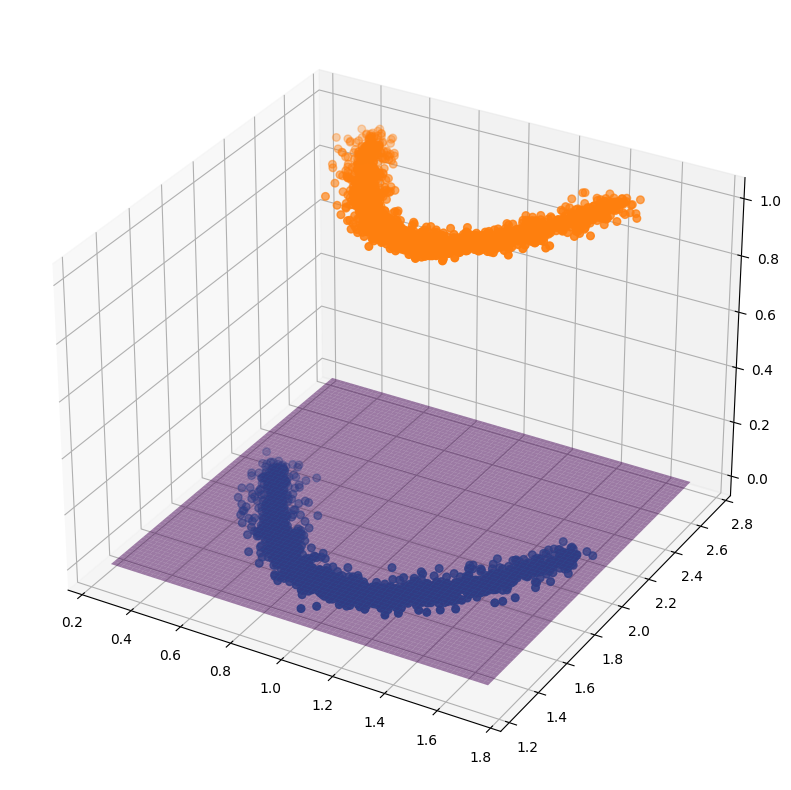

In [ ]:
# Part D -- plot the results for a chosen learning rate and epoch

#edited the code to include the plots
#chose a learning rate of 0.01 and an epoch of 5

import numpy as np
import random
import matplotlib.pyplot as plt
from mpl_toolkits. mplot3d import Axes3D

def NN241(learningrate,epoch,iterations):
  nData=2000
  nTrain =1000
  nEpoch=epoch # number of training points
  nTest = 2000
  alpha =learningrate #(learning rate)
  std=0.5
  x=np.zeros((2*nData,2))
  t=np.zeros((2*nData))
  r=np.random.normal(0,std,2*nData)
  the=2*np.pi*np.random.rand(2*nData)
  w11f=np.zeros(nEpoch*nTrain)
  w12f=np.zeros(nEpoch*nTrain)
  #cluster 1
  h=-6+12*np.random.rand(nData)
  v=5+(h**2)/6
  x[0:nData,0]=h + r[0:nData]*np.cos(the[0:nData])
  x[0:nData,1]=v + r[0:nData]*np.sin(the[0:nData])
  t[0:nData]=0
  #Cluster 2
  h=-5+10*np.random.rand(nData)
  v=10+(h**2)/4
  x[nData:2*nData,0]=h + r[nData:2*nData]*np.cos(the[nData:2*nData])
  x[nData:2*nData,1]=v + r[nData:2*nData]*np.sin(the[nData:2*nData])
  t[nData:2*nData]=1
  x[:,0]=1 + 0.1*x[:,0]
  x[:,1]=1 + 0.1*x[:,1]
  nSuccess=0
  for i in range(iterations):
    w11=0.5-np.random.rand(); w12=0.5-np.random.rand()
    w21=0.5-np.random.rand(); w22=0.5-np.random.rand()
    w31=0.5-np.random.rand(); w32=0.5-np.random.rand()
    w41=0.5-np.random.rand(); w42=0.5-np.random.rand()
    b2=0.5-np.random.rand(); b1=0.5-np.random.rand()
    b4=0.5-np.random.rand(); b3=0.5-np.random.rand()
    ww1=0.5-np.random.rand(); ww2=0.5-np.random.rand()
    ww3=0.5-np.random.rand(); ww4=0.5-np.random.rand()
    bb=0.5-np.random.rand()
    a=range(0,2*nData)
    sp=random.sample(a,nTrain+nTest)
    p=0
    for epoch in range(0,nEpoch):
      for i in range(0,nTrain):
        y1=b1+w11*x[sp[i],0]+w12*x[sp[i],1]
        y2=b2+w21*x[sp[i],0]+w22*x[sp[i],1]
        y3=b3+w31*x[sp[i],0]+w32*x[sp[i],1]
        y4=b4+w41*x[sp[i],0]+w42*x[sp[i],1]
        dxx1=y1>0; dxx2=y2>0; dxx3=y3>0; dxx4=y4>0 # this is the rectalinear function
        xx1=dxx1*y1;xx2=dxx2*y2; xx3=dxx3*y3;xx4=dxx4*y4
        yy= xx1*ww1 + xx2*ww2 + xx3*ww3 + xx4*ww4 + bb
        yy=yy>0
        e=t[sp[i]]-yy
        #updates -- back prop algo -- use derivatives and update rule
        ww1=ww1 + alpha*e*xx1; ww2=ww2 + alpha*e*xx2;
        ww3=ww3 + alpha*e*xx3; ww4=ww4 + alpha*e*xx4;
        bb=bb + alpha*e
        w11=w11 + alpha*e*ww1*dxx1*x[sp[i],0]
        w12=w12 + alpha*e*ww1*dxx1*x[sp[i],1]
        w21=w21 + alpha*e*ww2*dxx2*x[sp[i],0]
        w22=w22 + alpha*e*ww2*dxx2*x[sp[i],1]
        w31=w31 + alpha*e*ww3*dxx3*x[sp[i],0]
        w32=w32 + alpha*e*ww3*dxx3*x[sp[i],1]
        w41=w41 + alpha*e*ww4*dxx4*x[sp[i],0]
        w42=w42 + alpha*e*ww4*dxx4*x[sp[i],1]
        b1=b1 + alpha*e*ww1*dxx1;  b2=b2 + alpha*e*ww2*dxx2
        b3=b3 + alpha*e*ww3*dxx3;  b4=b4 + alpha*e*ww4*dxx4
        w11f [ p ]=w11 ; w12f [ p ]=w12 ;
        p=p+1
    er=0
    for i in range(nTrain,nTrain+nTest):
        y1 = b1 + w11*x[sp[i],0] + w12*x[sp[i],1]
        y2 = b2 + w21*x[sp[i],0] + w22*x[sp[i],1]
        y3=b3+w31*x[sp[i],0]+w32*x[sp[i],1]
        y4=b4+w41*x[sp[i],0]+w42*x[sp[i],1]

        dxx1=y1>0; dxx2=y2>0; dxx3=y3>0; dxx4=y4>0
        xx1=dxx1*y1;xx2=dxx2*y2; xx3=dxx3*y3;xx4=dxx4*y4

        yy= xx1*ww1 + xx2*ww2 + xx3*ww3 + xx4*ww4 + bb
        yy=yy>0
        e = abs(t[sp[i]] - yy)
        er=er+e
    er=er/nTest
    #print(er)
    if er<0.05:
      nSuccess=nSuccess+1
      plt.figure(figsize=(10,10))
      plt.scatter(x[0:nData,0], x[0:nData,1])
      plt.scatter(x[nData:2*nData,0], x[nData:2*nData,1])


      X = np.arange(0.25, 1.75, 0.02)
      Y = np.arange(1.25, 2.75, 0.02)
      X, Y = np.meshgrid(X, Y)
      y1 = b1 + w11*X + w12*Y
      y2 = b2 + w21*X + w22*Y
      dxx1=y1>0; xx1=y1*dxx1;  dxx2=y2>0; xx2=y2*dxx2     #  rect. activation
      yy = bb + ww1*xx1 + ww2*xx2
      Z=yy>0
      plt.scatter(X, Y, c=Z+1, alpha=0.3)

      plt.figure(figsize=(10,10))
      f=np.arange(0,nEpoch*nTrain,1)
      plt.plot(f,w11f)
      plt.figure(figsize=(10,10))
      plt.plot(f,w12f)
      plt.figure(figsize=(10,10))
      ax = plt.axes(projection='3d')
      ax.scatter(x[0:nData,0], x[0:nData,1], 0,  cmap='viridis', s=30)
      ax.scatter(x[nData:2*nData,0], x[nData:2*nData,1], 1,  cmap='viridis', s=30)

      #  ploting the separating planes
      X = np.arange(0.25, 1.75, 0.02)       # Shorter X-range for visibility
      Y = np.arange(1.25, 2.75, 0.02)

      X, Y = np.meshgrid(X, Y)
      y1 = b1 + w11*X + w12*Y
      y2 = b2 + w21*X + w22*Y
      dxx1=y1>0; xx1=y1*dxx1;  dxx2=y2>0; xx2=y2*dxx2     #  rect. activation
      yy = bb + ww1*xx1 + ww2*xx2
      Z=yy>0
      ax.plot_surface(X, Y, Z, rstride=1, cstride=1, cmap='viridis', alpha=0.5)
  return(nSuccess)

NN241(0.01,5,50)

Question 6.6.4

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt
from mpl_toolkits. mplot3d import Axes3D
import math

    ###################################Sigmoid Activation Code#################################

def NN241_sigmoud(learningrate,epoch,iterations):
    #######################   P a r a b o l i c  c l u s t e r s      ###########################
  #####################   S y n t h e t i c  Data C r e a t i o n     #########################

  nData=2000
  nTrain =1000
  nEpoch=epoch # number of training points
  nTest = 2000
  alpha =learningrate #(learning rate)

  std=0.5
  x=np.zeros((2*nData,2))
  t=np.zeros((2*nData))
  r=np.random.normal(0,std,2*nData)
  the=2*np.pi*np.random.rand(2*nData)

  # w11f=np.zeros(nEpoch*nTrain)
  # w12f=np.zeros(nEpoch*nTrain)



  #cluster 1
  h=-6+12*np.random.rand(nData)
  v=5+(h**2)/6
  x[0:nData,0]=h + r[0:nData]*np.cos(the[0:nData])
  x[0:nData,1]=v + r[0:nData]*np.sin(the[0:nData])
  t[0:nData]=0

  #Cluster 2
  h=-5+10*np.random.rand(nData)
  v=10+(h**2)/4
  x[nData:2*nData,0]=h + r[nData:2*nData]*np.cos(the[nData:2*nData])
  x[nData:2*nData,1]=v + r[nData:2*nData]*np.sin(the[nData:2*nData])
  t[nData:2*nData]=1

  #######################  Normalization   ################################
  x[:,0]=1 + 0.1*x[:,0]
  x[:,1]=1 + 0.1*x[:,1]
  nSuccess=0
  plott=[]
  for i in range(iterations):
    ################# Parameter Intialization    ############################
    #########################################################################

    w11=0.5-np.random.rand(); w12=0.5-np.random.rand()
    w21=0.5-np.random.rand(); w22=0.5-np.random.rand()

    w31=0.5-np.random.rand(); w32=0.5-np.random.rand()
    w41=0.5-np.random.rand(); w42=0.5-np.random.rand()


    b2=0.5-np.random.rand(); b1=0.5-np.random.rand()
    b4=0.5-np.random.rand(); b3=0.5-np.random.rand()

    ww1=0.5-np.random.rand(); ww2=0.5-np.random.rand()
    ww3=0.5-np.random.rand(); ww4=0.5-np.random.rand()

    bb=0.5-np.random.rand()

    a=range(0,2*nData)
    sp=random.sample(a,nTrain+nTest) # indexes for random selection of data fo
                                    #  training and testing

    #Training

    for epoch in range(0,nEpoch):
      for i in range(0,nTrain):
        #--------------------------------------------------------- Calculating the error so we can update ---------------------------------------------------------
        y1=b1+w11*x[sp[i],0]+w12*x[sp[i],1]
        y2=b2+w21*x[sp[i],0]+w22*x[sp[i],1]
        y3=b3+w31*x[sp[i],0]+w32*x[sp[i],1]
        y4=b4+w41*x[sp[i],0]+w42*x[sp[i],1]

        # this is where the sigmoid function comes
        #dxx1 = derivative of [xxx1=f(y1)] -> xxx1=sigmoid(y1) --> derivative = e^-z/(1+e^-z)^2

        # E^*(-Y)
        y1f=(math.exp(-y1))
        y2f=(math.exp(-y2))
        y3f=(math.exp(-y3))
        y4f=(math.exp(-y4))

        #DERIVATIVE OF THE SIGMOID FUNCTION
        dxx1=y1f/((1+y1f)**2)
        dxx2=y2f/((1+y2f)**2)
        dxx3=y3f/((1+y3f)**2)
        dxx4=y4f/((1+y4f)**2)

        #xx1=1/(1+y1f);xx2=1/(1+y2f); xx3=1/(1+y3f);xx4=1/(1+y4f)
        xx1=dxx1*y1
        xx2=dxx2*y2
        xx3=dxx3*y3
        xx4=dxx4*y4
        yy= xx1*ww1 + xx2*ww2 + xx3*ww3 + xx4*ww4 + bb
        yy=yy>0
        e=t[sp[i]]-yy
    #--------------------------------------------------------- ---------------------------------------------------------



        #updates -- back prop algo -- use derivatives and update rule
        ww1=ww1 + alpha*e*xx1
        ww2=ww2 + alpha*e*xx2
        ww3=ww3 + alpha*e*xx3
        ww4=ww4 + alpha*e*xx4
        bb=bb + alpha*e

        w11=w11 + alpha*e*ww1*dxx1*x[sp[i],0]
        w12=w12 + alpha*e*ww1*dxx1*x[sp[i],1]
        w21=w21 + alpha*e*ww2*dxx2*x[sp[i],0]
        w22=w22 + alpha*e*ww2*dxx2*x[sp[i],1]
        w31=w31 + alpha*e*ww3*dxx3*x[sp[i],0]
        w32=w32 + alpha*e*ww3*dxx3*x[sp[i],1]
        w41=w41 + alpha*e*ww4*dxx4*x[sp[i],0]
        w42=w42 + alpha*e*ww4*dxx4*x[sp[i],1]

        b1=b1 + alpha*e*ww1*dxx1
        b2=b2 + alpha*e*ww2*dxx2
        b3=b3 + alpha*e*ww3*dxx3
        b4=b4 + alpha*e*ww4*dxx4

    #testing

    er=0
    for i in range(nTrain,nTrain+nTest):
        y1 = b1 + w11*x[sp[i],0] + w12*x[sp[i],1]
        y2 = b2 + w21*x[sp[i],0] + w22*x[sp[i],1]
        y3=  b3 + w31*x[sp[i],0]+w32*x[sp[i],1]
        y4=  b4 + w41*x[sp[i],0]+w42*x[sp[i],1]

        y1f=(math.exp(-y1))
        y2f=(math.exp(-y2))
        y3f=(math.exp(-y3))
        y4f=(math.exp(-y4))

        #xx1=1/(1+y1f);xx2=1/(1+y2f); xx3=1/(1+y3f);xx4=1/(1+y4f)

        dxx1=y1f/((1+y1f)**2)
        dxx2=y2f/((1+y2f)**2)
        dxx3=y3f/((1+y3f)**2)
        dxx4=y4f/((1+y4f)**2)

        xx1=dxx1*y1
        xx2=dxx2*y2
        xx3=dxx3*y3
        xx4=dxx4*y4

        yy= xx1*ww1 + xx2*ww2 + xx3*ww3 + xx4*ww4 + bb
        yy=yy>0 # this is what is actually doing the splitting of the output. this will make anything less than a zero output a false (ie a zero) and anything greater than zero a true(ie. a one)
        e = abs(t[sp[i]] - yy)
        er=er+e
    er=er/nTest
    #print(er)
    if er<0.05:
      nSuccess=nSuccess+1
      plott.append(nSuccess)
    else:
      plott.append(nSuccess)
  return(plott,nSuccess)

    #print(er)

In [ ]:



 ########################################## Rectilinear activation function ###################################
import numpy as np
import random
import matplotlib.pyplot as plt
from mpl_toolkits. mplot3d import Axes3D

def NN241_rect(learningrate,epoch,iterations):
  nData=2000
  nTrain =1000
  nEpoch=epoch # number of training points
  nTest = 2000
  alpha =learningrate #(learning rate)
  std=0.5
  x=np.zeros((2*nData,2))
  t=np.zeros((2*nData))
  r=np.random.normal(0,std,2*nData)
  the=2*np.pi*np.random.rand(2*nData)
  # w11f=np.zeros(nEpoch*nTrain)
  # w12f=np.zeros(nEpoch*nTrain)
  #cluster 1
  h=-6+12*np.random.rand(nData)
  v=5+(h**2)/6
  x[0:nData,0]=h + r[0:nData]*np.cos(the[0:nData])
  x[0:nData,1]=v + r[0:nData]*np.sin(the[0:nData])
  t[0:nData]=0
  #Cluster 2
  h=-5+10*np.random.rand(nData)
  v=10+(h**2)/4
  x[nData:2*nData,0]=h + r[nData:2*nData]*np.cos(the[nData:2*nData])
  x[nData:2*nData,1]=v + r[nData:2*nData]*np.sin(the[nData:2*nData])
  t[nData:2*nData]=1
  x[:,0]=1 + 0.1*x[:,0]
  x[:,1]=1 + 0.1*x[:,1]
  plott=[]
  for i in range(iterations):
    w11=0.5-np.random.rand(); w12=0.5-np.random.rand()
    w21=0.5-np.random.rand(); w22=0.5-np.random.rand()
    w31=0.5-np.random.rand(); w32=0.5-np.random.rand()
    w41=0.5-np.random.rand(); w42=0.5-np.random.rand()
    b2=0.5-np.random.rand(); b1=0.5-np.random.rand()
    b4=0.5-np.random.rand(); b3=0.5-np.random.rand()
    ww1=0.5-np.random.rand(); ww2=0.5-np.random.rand()
    ww3=0.5-np.random.rand(); ww4=0.5-np.random.rand()
    bb=0.5-np.random.rand()
    a=range(0,2*nData)
    sp=random.sample(a,nTrain+nTest)
    nSuccess=0

    for epoch in range(0,nEpoch):
      for i in range(0,nTrain):
        y1=b1+w11*x[sp[i],0]+w12*x[sp[i],1]
        y2=b2+w21*x[sp[i],0]+w22*x[sp[i],1]
        y3=b3+w31*x[sp[i],0]+w32*x[sp[i],1]
        y4=b4+w41*x[sp[i],0]+w42*x[sp[i],1]
        dxx1=y1>0; dxx2=y2>0; dxx3=y3>0; dxx4=y4>0 # this is the rectalinear function
        xx1=dxx1*y1;xx2=dxx2*y2; xx3=dxx3*y3;xx4=dxx4*y4
        yy= xx1*ww1 + xx2*ww2 + xx3*ww3 + xx4*ww4 + bb
        yy=yy>0
        e=t[sp[i]]-yy
        #updates -- back prop algo -- use derivatives and update rule
        ww1=ww1 + alpha*e*xx1; ww2=ww2 + alpha*e*xx2;
        ww3=ww3 + alpha*e*xx3; ww4=ww4 + alpha*e*xx4;
        bb=bb + alpha*e
        w11=w11 + alpha*e*ww1*dxx1*x[sp[i],0]
        w12=w12 + alpha*e*ww1*dxx1*x[sp[i],1]
        w21=w21 + alpha*e*ww2*dxx2*x[sp[i],0]
        w22=w22 + alpha*e*ww2*dxx2*x[sp[i],1]
        w31=w31 + alpha*e*ww3*dxx3*x[sp[i],0]
        w32=w32 + alpha*e*ww3*dxx3*x[sp[i],1]
        w41=w41 + alpha*e*ww4*dxx4*x[sp[i],0]
        w42=w42 + alpha*e*ww4*dxx4*x[sp[i],1]
        b1=b1 + alpha*e*ww1*dxx1;  b2=b2 + alpha*e*ww2*dxx2
        b3=b3 + alpha*e*ww3*dxx3;  b4=b4 + alpha*e*ww4*dxx4
    er=0
    for i in range(nTrain,nTrain+nTest):
        y1 = b1 + w11*x[sp[i],0] + w12*x[sp[i],1]
        y2 = b2 + w21*x[sp[i],0] + w22*x[sp[i],1]
        y3=b3+w31*x[sp[i],0]+w32*x[sp[i],1]
        y4=b4+w41*x[sp[i],0]+w42*x[sp[i],1]
        dxx1=y1>0; dxx2=y2>0; dxx3=y3>0; dxx4=y4>0
        xx1=dxx1*y1;xx2=dxx2*y2; xx3=dxx3*y3;xx4=dxx4*y4

        yy= xx1*ww1 + xx2*ww2 + xx3*ww3 + xx4*ww4 + bb
        yy=yy>0
        e = abs(t[sp[i]] - yy)
        er=er+e
    er=er/nTest
    #print(er)
    if er<0.05:
      nSuccess=nSuccess+1
      plott.append(nSuccess)
    else:
      plott.append(nSuccess)

  return(plott,nSuccess)


6
3


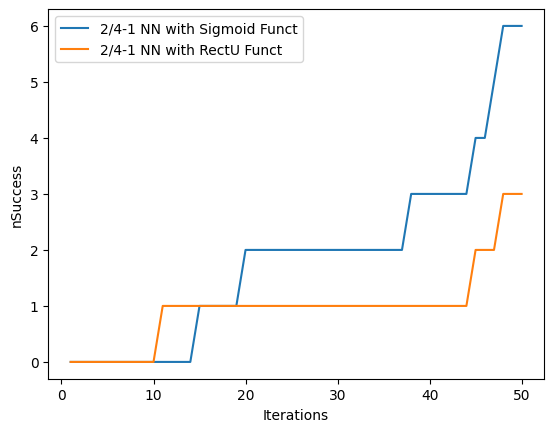

In [ ]:
#Plot
#RUN SIGMOID CODE FOR BEST ALPHA AND EPOCH, FOR 50 ITERATIONS - SAVE THE NSUCESS IN AN ARRAY
#DO SAME AS ABOVE FOR RECTILINEAR FUNCTION AND SAVE THE NSUCESS IN AN ARRAY
#PLOT THE TWO AGAINST THE ITERATIONS

#I will be using a epoch =3 and learning rate of 0.008
xaxis= range(1,51)

#SIGMOID RUN
sig,nSUCC_sig=NN241_sigmoud(0.006,3,50)
plt.plot(xaxis,sig, label='2/4-1 NN with Sigmoid Funct')
print(nSUCC_sig)
#Rectalineaer Function
react,nSUCC_react=NN241_sigmoud(0.006,3,50)
plt.plot(xaxis,react, label='2/4-1 NN with RectU Funct')
print(nSUCC_react)

#plotting both lines
plt.xlabel('Iterations')
plt.ylabel('nSuccess')
plt.legend()
plt.show()


Below is the plot, I got for one of my runs for quetion 6.64. 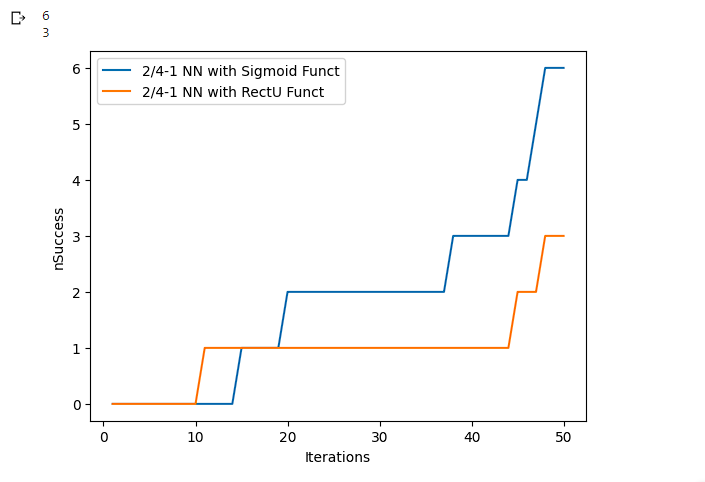

Question 6.6.5

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


def NN241(learningrate,epoch,iterations):
  nData=4000
  nTrain =2000
  nEpoch=epoch # number of training points
  nTest = 2000
  alpha =learningrate #(learning rate)


  x=np.zeros((nData,2))
  t=np.zeros((nData))
  # w11f=np.zeros(nEpoch*nTrain)
  # w12f=np.zeros(nEpoch*nTrain)

  data=np. load('/approximatemeifyoucan.npy')

  #split the x1 and x2 into column 1 and column 2 of the x array and the target array should be set to third row of our data

  x[0:nData,0]= data[0,:]
  x[0:nData,1]= data[1,:]
  t[0:nData]= data[2,:]

  #######################  Normalization   ################################
 # x[:,0]=1 + 0.1*x[:,0]
#  x[:,1]=1 + 0.1*x[:,1]

  nSuccess=0
  temp=[]
  avg_mse=[]
  for i in range(iterations):
    temp.clear()
    #paramter initilization -- use the ReLU activation function and a 2/4-1 NN

    w11=0.5-np.random.rand(); w12=0.5-np.random.rand()
    w21=0.5-np.random.rand(); w22=0.5-np.random.rand()

    w31=0.5-np.random.rand(); w32=0.5-np.random.rand()
    w41=0.5-np.random.rand(); w42=0.5-np.random.rand()


    b2=0.5-np.random.rand(); b1=0.5-np.random.rand()
    b4=0.5-np.random.rand(); b3=0.5-np.random.rand()

    ww1=0.5-np.random.rand(); ww2=0.5-np.random.rand()
    ww3=0.5-np.random.rand(); ww4=0.5-np.random.rand()

    bb=0.5-np.random.rand()

    # used to get random values for testing
    a=range(0,4000)
    sp=random.sample(a,nTrain+nTest)

    #Training

    for epoch in range(0,nEpoch):
      for i in range(0,nTrain):
        y1=b1+w11*x[sp[i],0]+w12*x[sp[i],1]
        y2=b2+w21*x[sp[i],0]+w22*x[sp[i],1]
        y3=b3+w31*x[sp[i],0]+w32*x[sp[i],1]
        y4=b4+w41*x[sp[i],0]+w42*x[sp[i],1]

        # rectalinear function
        if (y1<0):
          xx1=0
          dxx1=0
        else:
          xx1=y1
          dxx1=1

        if (y2<0):
          xx2=0
          dxx2=0
        else:
          xx2=y2
          dxx2=1

        if (y3<0):
          xx3=0
          dxx3=0
        else:
          xx3=y3
          dxx3=1

        if (y4<0):
          xx4=0
          dxx4=0
        else:
          xx4=y4
          dxx4=1

        yy= xx1*ww1 + xx2*ww2 + xx3*ww3 + xx4*ww4 + bb
        #yy=yy>0
        # error function -- the below will output an actualy number instead of just a 0 or 1
        e=(t[sp[i]]-yy)


        #updates -- back prop algo -- use derivatives and update rule
        ww1=ww1 + alpha*e*xx1; ww2=ww2 + alpha*e*xx2;
        ww3=ww3 + alpha*e*xx3; ww4=ww4 + alpha*e*xx4;
        bb=bb + alpha*e

        w11=w11 + alpha*e*ww1*dxx1*x[sp[i],0]
        w12=w12 + alpha*e*ww1*dxx1*x[sp[i],1]
        w21=w21 + alpha*e*ww2*dxx2*x[sp[i],0]
        w22=w22 + alpha*e*ww2*dxx2*x[sp[i],1]
        w31=w31 + alpha*e*ww3*dxx3*x[sp[i],0]
        w32=w32 + alpha*e*ww3*dxx3*x[sp[i],1]
        w41=w41 + alpha*e*ww4*dxx4*x[sp[i],0]
        w42=w42 + alpha*e*ww4*dxx4*x[sp[i],1]

        b1=b1 + alpha*e*ww1*dxx1;  b2=b2 + alpha*e*ww2*dxx2
        b3=b3 + alpha*e*ww3*dxx3;  b4=b4 + alpha*e*ww4*dxx4

    #testing


    for i in range(nTrain,nTrain+nTest):

        y1 = b1 + w11*x[sp[i],0] + w12*x[sp[i],1]
        y2 = b2 + w21*x[sp[i],0] + w22*x[sp[i],1]
        y3=  b3 + w31*x[sp[i],0]+w32*x[sp[i],1]
        y4=  b4 + w41*x[sp[i],0]+w42*x[sp[i],1]

        # rectalinear function
        if (y1<0):
          xx1=0
          dxx1=0
        else:
          xx1=y1
          dxx1=1

        if (y2<0):
          xx2=0
          dxx2=0
        else:
          xx2=y2
          dxx2=1

        if (y3<0):
          xx3=0
          dxx3=0
        else:
          xx3=y3
          dxx3=1

        if (y4<0):
          xx4=0
          dxx4=0
        else:
          xx4=y4
          dxx4=1

        yy= xx1*ww1 + xx2*ww2 + xx3*ww3 + xx4*ww4 + bb
        e=abs(t[sp[i]]-yy)**2
        temp.append(e)
    mse=(sum(temp))/nTest
    avg_mse.append(mse)
    #print(mse)
  avg=(sum(avg_mse)/iterations)
  return(format(avg,".2f"))
    #print(er)

In [ ]:
#testing to see which mean squared error to use

import pandas as pd
from tabulate import tabulate
data={}
temp=[]

def add_values_in_dict(sample_dict, key, list_of_values):
    ''' Append multiple values to a key in
        the given dictionary '''
    if key not in sample_dict:
        sample_dict[key] = list()
    sample_dict[key].extend(list_of_values)
    return sample_dict


# from 0.001 to 0.01 increment by 0.001
for alpha in np.arange(0.001,0.01,0.001):
  temp.clear()
  for epoch in range(1,7):
    #print("Learning Rate:",alpha)
    #print("Number of Epoch:",epoch)
    result=NN241(alpha,epoch,50)
    temp.append(result)
    #print("The Average Mean Squared Error is :",result)
    #print("--------------------------------")
    if epoch ==6:
      add_values_in_dict(data,alpha,temp)


for alpha in np.arange(0.01,0.06,0.01):
  temp.clear()
  for epoch in range(1,7):
    #print("Learning Rate:",alpha)
    #print("Number of Epoch:",epoch)
    result=NN241(alpha,epoch,50)
    temp.append(result)
    #print("The Average Mean Squared Error is is :",result)
    #print("--------------------------------")
    if epoch ==6:
      add_values_in_dict(data,alpha,temp)

#define header names
col_names = ["Epoch =1", "Epoch =2", "Epoch =3", "Epoch =4", "Epoch =5", "Epoch =6"]

#display table
df = pd.DataFrame.from_dict(data, orient='index', columns=col_names)
print(tabulate(df, headers = col_names, tablefmt = 'psql'))

+-------+------------+------------+------------+------------+------------+------------+
|       |   Epoch =1 |   Epoch =2 |   Epoch =3 |   Epoch =4 |   Epoch =5 |   Epoch =6 |
|-------+------------+------------+------------+------------+------------+------------|
| 0.001 |       0.28 |       0.22 |       0.17 |       0.15 |       0.11 |       0.09 |
| 0.002 |       0.18 |       0.13 |       0.07 |       0.05 |       0.06 |       0.05 |
| 0.003 |       0.19 |       0.1  |       0.08 |       0.04 |       0.06 |       0.05 |
| 0.004 |       0.11 |       0.09 |       0.05 |       0.03 |       0.05 |       0.05 |
| 0.005 |       0.12 |       0.09 |       0.04 |       0.03 |       0.03 |       0.05 |
| 0.006 |       0.09 |       0.06 |       0.06 |       0.03 |       0.04 |       0.03 |
| 0.007 |       0.08 |       0.06 |       0.03 |       0.02 |       0.03 |       0.04 |
| 0.008 |       0.07 |       0.05 |       0.05 |       0.04 |       0.03 |       0.03 |
| 0.009 |       0.06 |       0.0

In the above, I dont know if what I did is correct but I basically decided to use mean squared error as a way to track performance. For the 1000 test points, I calculated the mean square error and appended that into an array. This array holds the the mean square error for all of the 50 iterations. Finally I calculated the average on this array, giving the average mean squared error over the 50 iterations, where for each iteration we are training a 1000 data points.


To expiriment with how the learning rate and epochs affected the mean squared error, I created a table, which was similar to that of the other questions.  I noticed that the mean squared error decreased as the learning rate increased.

As the epoch grew, I noticed the mean square error also decreased. The table from one of my runs is posted below. 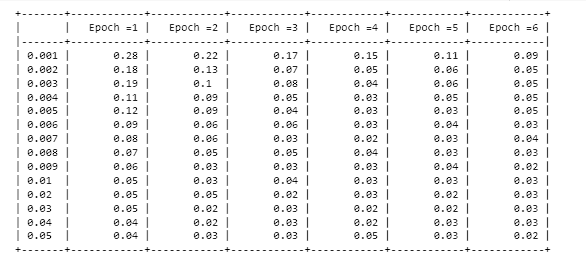


From there I decided to use a Epoch: 4 and LearningRate : 0.04


Now that we have found the ideal epoch and learning rate, I just made some changes to the original code, so that the paramters are outputted. These paramters are then applied to  finaltest.  

In [ ]:
# Below, I am taking the original code, I created above and just returning all the paramters we updated. So that I can apply these  paramters to the finaltest file and obtain the results.

import numpy as np
import random
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


def NN241(learningrate,epoch,iterations):
  nData=4000
  nTrain =2000
  nEpoch=epoch # number of training points
  nTest = 2000
  alpha =learningrate #(learning rate)


  x=np.zeros((nData,2))
  t=np.zeros((nData))
  # w11f=np.zeros(nEpoch*nTrain)
  # w12f=np.zeros(nEpoch*nTrain)

  data=np. load('/approximatemeifyoucan.npy')

  #split the x1 and x2 into column 1 and column 2 of the x array and the target array should be set to third row of our data

  x[0:nData,0]= data[0,:]
  x[0:nData,1]= data[1,:]
  t[0:nData]= data[2,:]

  #######################  Normalization   ################################
 # x[:,0]=1 + 0.1*x[:,0]
#  x[:,1]=1 + 0.1*x[:,1]

  nSuccess=0
  temp=[]
  avg_mse=[]
  for i in range(iterations):
    temp.clear()
    #paramter initilization -- use the ReLU activation function and a 2/4-1 NN

    w11=0.5-np.random.rand(); w12=0.5-np.random.rand()
    w21=0.5-np.random.rand(); w22=0.5-np.random.rand()

    w31=0.5-np.random.rand(); w32=0.5-np.random.rand()
    w41=0.5-np.random.rand(); w42=0.5-np.random.rand()


    b2=0.5-np.random.rand(); b1=0.5-np.random.rand()
    b4=0.5-np.random.rand(); b3=0.5-np.random.rand()

    ww1=0.5-np.random.rand(); ww2=0.5-np.random.rand()
    ww3=0.5-np.random.rand(); ww4=0.5-np.random.rand()

    bb=0.5-np.random.rand()

    # used to get random values for testing
    a=range(0,4000)
    sp=random.sample(a,nTrain+nTest)

    #Training

    for epoch in range(0,nEpoch):
      for i in range(0,nTrain):
        y1=b1+w11*x[sp[i],0]+w12*x[sp[i],1]
        y2=b2+w21*x[sp[i],0]+w22*x[sp[i],1]
        y3=b3+w31*x[sp[i],0]+w32*x[sp[i],1]
        y4=b4+w41*x[sp[i],0]+w42*x[sp[i],1]

        # rectalinear function
        if (y1<0):
          xx1=0
          dxx1=0
        else:
          xx1=y1
          dxx1=1

        if (y2<0):
          xx2=0
          dxx2=0
        else:
          xx2=y2
          dxx2=1

        if (y3<0):
          xx3=0
          dxx3=0
        else:
          xx3=y3
          dxx3=1

        if (y4<0):
          xx4=0
          dxx4=0
        else:
          xx4=y4
          dxx4=1

        yy= xx1*ww1 + xx2*ww2 + xx3*ww3 + xx4*ww4 + bb
        #yy=yy>0
        # error function -- the below will output an actualy number instead of just a 0 or 1
        e=(t[sp[i]]-yy)


        #updates -- back prop algo -- use derivatives and update rule
        ww1=ww1 + alpha*e*xx1; ww2=ww2 + alpha*e*xx2;
        ww3=ww3 + alpha*e*xx3; ww4=ww4 + alpha*e*xx4;
        bb=bb + alpha*e

        w11=w11 + alpha*e*ww1*dxx1*x[sp[i],0]
        w12=w12 + alpha*e*ww1*dxx1*x[sp[i],1]
        w21=w21 + alpha*e*ww2*dxx2*x[sp[i],0]
        w22=w22 + alpha*e*ww2*dxx2*x[sp[i],1]
        w31=w31 + alpha*e*ww3*dxx3*x[sp[i],0]
        w32=w32 + alpha*e*ww3*dxx3*x[sp[i],1]
        w41=w41 + alpha*e*ww4*dxx4*x[sp[i],0]
        w42=w42 + alpha*e*ww4*dxx4*x[sp[i],1]

        b1=b1 + alpha*e*ww1*dxx1;  b2=b2 + alpha*e*ww2*dxx2
        b3=b3 + alpha*e*ww3*dxx3;  b4=b4 + alpha*e*ww4*dxx4

    #testing


    for i in range(nTrain,nTrain+nTest):

        y1 = b1 + w11*x[sp[i],0] + w12*x[sp[i],1]
        y2 = b2 + w21*x[sp[i],0] + w22*x[sp[i],1]
        y3=  b3 + w31*x[sp[i],0]+w32*x[sp[i],1]
        y4=  b4 + w41*x[sp[i],0]+w42*x[sp[i],1]

        # rectalinear function
        if (y1<0):
          xx1=0
          dxx1=0
        else:
          xx1=y1
          dxx1=1

        if (y2<0):
          xx2=0
          dxx2=0
        else:
          xx2=y2
          dxx2=1

        if (y3<0):
          xx3=0
          dxx3=0
        else:
          xx3=y3
          dxx3=1

        if (y4<0):
          xx4=0
          dxx4=0
        else:
          xx4=y4
          dxx4=1

        yy= xx1*ww1 + xx2*ww2 + xx3*ww3 + xx4*ww4 + bb
        e=abs(t[sp[i]]-yy)**2
        temp.append(e)
    mse=(sum(temp))/nTest
    avg_mse.append(mse)
    #print(mse)
  avg=(sum(avg_mse)/iterations)
  return(b1,b2,b3,b4,w11,w12,w21,w22,w31,w32,w41,w42,ww1,ww2,ww3,ww4,bb)
    #print(er)

In [ ]:
#The final result array is printed once this cell of code is run

new_data=np. load('/finaltest.npy')
x=np.zeros((2000,2))
x[0:2000,0]= new_data[0,:]
x[0:2000,1]= new_data[1,:]

b1,b2,b3,b4,w11,w12,w21,w22,w31,w32,w41,w42,ww1,ww2,ww3,ww4,bb=NN241(0.04,4,50)
result=[]
for i in range(2000):
    y1 = b1 + w11*x[i,0] + w12*x[i,1]
    y2 = b2 + w21*x[i,0] + w22*x[i,1]
    y3=  b3 + w31*x[i,0]+w32*x[i,1]
    y4=  b4 + w41*x[i,0]+w42*x[i,1]

    if (y1<0):
      xx1=0
      dxx1=0
    else:
      xx1=y1
      dxx1=1

    if (y2<0):
      xx2=0
      dxx2=0
    else:
      xx2=y2
      dxx2=1

    if (y3<0):
      xx3=0
      dxx3=0
    else:
      xx3=y3
      dxx3=1

    if (y4<0):
      xx4=0
      dxx4=0
    else:
      xx4=y4
      dxx4=1

    yy= xx1*ww1 + xx2*ww2 + xx3*ww3 + xx4*ww4 + bb
    result.append(yy)





In [ ]:
print(result)

[1.8055068164583281, 2.4988048280239408, 1.1424558793641675, 1.342515451025927, 1.7411381422438972, 1.0514694829865314, 1.6606866741292778, 1.7492927295334244, 1.945232443101044, 2.137780686503936, 3.0325606813461734, 1.2391292147644453, 3.4250402165929588, 1.3688177426636643, 2.312945761967955, 1.8454252624286607, 1.8662904883942506, 2.022614497565625, 1.2837922664151897, 1.8406882932821347, 2.297849377806318, 1.6525609443969964, 1.5195873388677779, 1.869023420175333, 1.437412771805914, 1.869329007255027, 2.441287879175467, 1.4415360372465227, 2.234189132359935, 2.5952889361950993, 2.524488020198648, 1.2711868836262923, 1.394484483368553, 2.8806705709271165, 1.827410826995002, 1.1298432863281251, 2.0713873358786348, 2.885430513283106, 1.5753554063354005, 2.426700143999195, 1.5199098620821707, 1.2711709659616717, 1.8822599773545874, 3.2230293652949715, 2.140143256769769, 2.7390215979951353, 1.9386134906060482, 1.2702069920593924, 2.691584293507277, 1.443320749914225, 1.8344034071478281